In [18]:
import cv2
import os
import pandas as pd
import numpy as np
from scipy.spatial.distance import cosine, euclidean
from extractors.gabor import gabor_extractor  # Assuming gabor.py contains the gabor_extractor function
import ast

def convert_features(features_str):
    return np.array(ast.literal_eval(features_str))

df = pd.read_csv("csvs/gabor_features_cropped.csv")

query_image_path = "sample2.jpg"

df['features'] = df['features'].apply(convert_features)

def extract_gabor_features(image):
    features = gabor_extractor(image)
    return features

query_image = cv2.imread(query_image_path)
if query_image is None:
    print("Error: Unable to load the query image.")
    exit()

query_features = extract_gabor_features(query_image)

df['cosine_similarity'] = df['features'].apply(lambda x: 1 - cosine(query_features, x))
df['euclidean_distance'] = df['features'].apply(lambda x: euclidean(query_features, x))

df_sorted_cosine = df.sort_values(by='cosine_similarity', ascending=False)
df_sorted_euclidean = df.sort_values(by='euclidean_distance')

top_5_cosine = df_sorted_cosine.head(5)['name'].tolist()
top_5_euclidean = df_sorted_euclidean.head(5)['name'].tolist()

print("Top 5 closest images based on cosine similarity:")
print(top_5_cosine)
print("\nTop 5 closest images based on Euclidean distance:")
print(top_5_euclidean)

Top 5 closest images based on cosine similarity:
['WEB21J002-Q11@15.1.jpg', 'JA222S12U-Q11@13.1.jpg', 'JA222S11W-Q11@8.jpg', 'UR621J02E-Q11@1.1.jpg', 'UR622J003-Q12@10.jpg']

Top 5 closest images based on Euclidean distance:
['WEB21J002-Q11@15.1.jpg', 'JA222S12U-Q11@13.1.jpg', 'JA222S11W-Q11@8.jpg', 'UR621J02E-Q11@1.1.jpg', 'UR622J003-Q12@10.jpg']


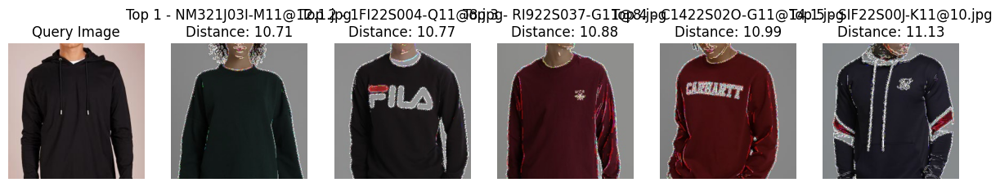

In [28]:
import csv
import ast
import os
from scipy.spatial.distance import mahalanobis
import cv2
import matplotlib.pyplot as plt
import numpy as np
from extractors.gabor import gabor_extractor  # Assuming your gabor extractor module

features = []
image_names = []
with open("csvs/gabor_features_sampleddata.csv", "r") as csvfile:
    reader = csv.reader(csvfile)
    next(reader) 
    for row in reader:
        image_names.append(row[0])
        features.append([float(x) for x in ast.literal_eval(row[1])])


def get_all_image_paths(parent_dir):
    
    image_paths = []
    for dirpath, dirnames, filenames in os.walk(parent_dir):
        for filename in filenames:
            if filename.lower().endswith((".jpg", ".jpeg", ".png")):
                image_paths.append(os.path.join(dirpath, filename))
    return image_paths


def calculate_distances(query_image_path, top_n=5):


    query_image = cv2.imread(query_image_path)
    query_features = gabor_extractor(query_image)

    query_features = np.array(query_features) 

    all_image_paths = get_all_image_paths(parent_dir)  

    all_image_features = []
    for image_path in all_image_paths:
        image = cv2.imread(image_path)
        features = gabor_extractor(image)
        all_image_features.append(features)

    covariance_matrix = np.cov(np.array(all_image_features).T)

    distances = []
    for image_features in all_image_features:
        distance = mahalanobis(query_features, image_features, np.linalg.inv(covariance_matrix))
        distances.append(distance)

    sorted_data = sorted(zip(all_image_paths, distances), key=lambda x: x[1])
    return sorted_data[:top_n]


parent_dir = "data/preprocessed"
query_image_path = "sample2.jpg"

top_distances = calculate_distances(query_image_path)

fig, axes = plt.subplots(1, 6, figsize=(15, 5)) 

axes[0].imshow(cv2.cvtColor(cv2.imread(query_image_path), cv2.COLOR_BGR2RGB))
axes[0].set_title("Query Image")
axes[0].axis("off")

for i, (image_path, distance) in enumerate(top_distances, start=1):
    similar_image = cv2.imread(image_path)
    axes[i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[i].set_title(f"Top {i} - {os.path.basename(image_path)}\nDistance: {distance:.2f}")
    axes[i].axis("off")

plt.show()

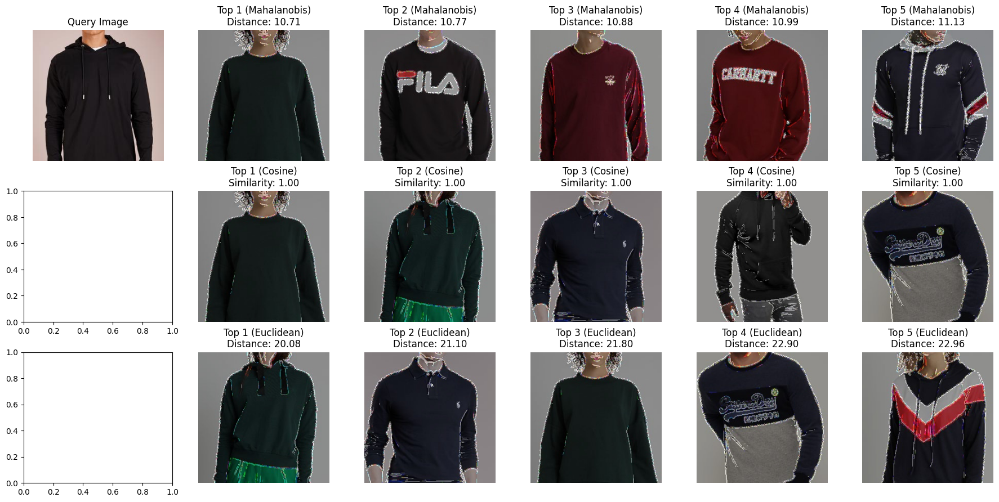

In [33]:
import csv
import ast
import os
from scipy.spatial.distance import mahalanobis, cosine, euclidean
import cv2
import matplotlib.pyplot as plt
import numpy as np
from extractors.gabor import gabor_extractor  # Assuming your gabor extractor module

features = []
image_names = []
with open("csvs/gabor_features_preprocessed.csv", "r") as csvfile:
    reader = csv.reader(csvfile)
    next(reader)  # Skip header row
    for row in reader:
        image_names.append(row[0])
        features.append([float(x) for x in ast.literal_eval(row[1])])


def get_all_image_paths(parent_dir):

    image_paths = []
    for dirpath, dirnames, filenames in os.walk(parent_dir):
        for filename in filenames:
            if filename.lower().endswith((".jpg", ".jpeg", ".png")):
                image_paths.append(os.path.join(dirpath, filename))
    return image_paths


def calculate_distances(query_image_path, parent_dir, top_n=5):

    query_image = cv2.imread(query_image_path)
    query_features = gabor_extractor(query_image)

    query_features = np.array(query_features)

    all_image_paths = get_all_image_paths(parent_dir)
    
    all_image_features = []
    
    for image_path in all_image_paths:
        image = cv2.imread(image_path)
        features = gabor_extractor(image)
        all_image_features.append(features)
        
    covariance_matrix = np.cov(np.array(all_image_features).T)

    mahalanobis_distances = []
    cosine_similarities = []
    euclidean_distances = []
    for image_features in all_image_features:
        mahalanobis_dist = mahalanobis(query_features, image_features, np.linalg.inv(covariance_matrix))
        mahalanobis_distances.append(mahalanobis_dist)

        cosine_sim = 1 - cosine(query_features, image_features)
        cosine_similarities.append(cosine_sim)

        euclidean_dist = euclidean(query_features, image_features)
        euclidean_distances.append(euclidean_dist)

    sorted_data_mahalanobis = sorted(zip(all_image_paths, mahalanobis_distances), key=lambda x: x[1])
    sorted_data_cosine = sorted(zip(all_image_paths, cosine_similarities), key=lambda x: x[1], reverse=True)
    sorted_data_euclidean = sorted(zip(all_image_paths, euclidean_distances), key=lambda x: x[1])

    return sorted_data_mahalanobis[:top_n], sorted_data_cosine[:top_n], sorted_data_euclidean[:top_n]


parent_dir = "data/preprocessed"
query_image_path = "sample2.jpg"

top_distances_mahalanobis, top_distances_cosine, top_distances_euclidean = calculate_distances(query_image_path, parent_dir)

fig, axes = plt.subplots(3, 6, figsize=(18, 9))  # 3 rows, 6 columns

axes[0, 0].imshow(cv2.cvtColor(cv2.imread(query_image_path), cv2.COLOR_BGR2RGB))
axes[0, 0].set_title("Query Image")
axes[0, 0].axis("off")

for i, (image_path, distance) in enumerate(top_distances_mahalanobis, start=1):
    similar_image = cv2.imread(image_path)
    axes[0, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"Top {i} (Mahalanobis)\nDistance: {distance:.2f}")
    axes[0, i].axis("off")

for i, (image_path, similarity) in enumerate(top_distances_cosine, start=1):
    similar_image = cv2.imread(image_path)
    axes[1, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f"Top {i} (Cosine)\nSimilarity: {similarity:.2f}")
    axes[1, i].axis("off")

for i, (image_path, distance) in enumerate(top_distances_euclidean, start=1):
    similar_image = cv2.imread(image_path)
    axes[2, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[2, i].set_title(f"Top {i} (Euclidean)\nDistance: {distance:.2f}")
    axes[2, i].axis("off")

for i in range(1, 6):
    axes[0, i].axis("off")
    axes[1, i].axis("off")
    axes[2, i].axis("off")

plt.tight_layout()
plt.show()


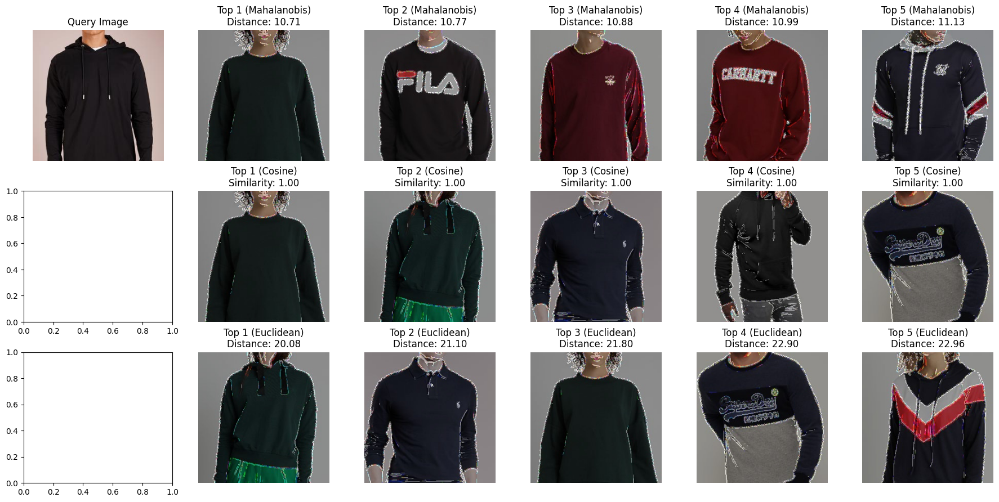

In [34]:
import csv
import ast
import os
from scipy.spatial.distance import mahalanobis, cosine, euclidean
import cv2
import matplotlib.pyplot as plt
import numpy as np
from extractors.gabor import gabor_extractor

features = []
image_names = []
with open("csvs/gabor_features_sampleddata.csv", "r") as csvfile:
    reader = csv.reader(csvfile)
    next(reader) 
    for row in reader:
        image_names.append(row[0])
        features.append([float(x) for x in ast.literal_eval(row[1])])


def get_all_image_paths(parent_dir):

    image_paths = []
    for dirpath, dirnames, filenames in os.walk(parent_dir):
        for filename in filenames:
            if filename.lower().endswith((".jpg", ".jpeg", ".png")):
                image_paths.append(os.path.join(dirpath, filename))
    return image_paths


def calculate_distances(query_image_path, parent_dir, top_n=5):
    query_image = cv2.imread(query_image_path)
    
    query_features = gabor_extractor(query_image)

    query_features = np.array(query_features)  
    all_image_paths = get_all_image_paths(parent_dir)
    
    all_image_features = []
    
    for image_path in all_image_paths:
        image = cv2.imread(image_path)
        features = gabor_extractor(image)
        all_image_features.append(features)
        
    covariance_matrix = np.cov(np.array(all_image_features).T)

    mahalanobis_distances = []
    cosine_similarities = []
    euclidean_distances = []
    for image_features in all_image_features:
        mahalanobis_dist = mahalanobis(query_features, image_features, np.linalg.inv(covariance_matrix))
        mahalanobis_distances.append(mahalanobis_dist)

        cosine_sim = 1 - cosine(query_features, image_features)
        cosine_similarities.append(cosine_sim)

        euclidean_dist = euclidean(query_features, image_features)
        euclidean_distances.append(euclidean_dist)

    sorted_data_mahalanobis = sorted(zip(all_image_paths, mahalanobis_distances), key=lambda x: x[1])
    sorted_data_cosine = sorted(zip(all_image_paths, cosine_similarities), key=lambda x: x[1], reverse=True)
    sorted_data_euclidean = sorted(zip(all_image_paths, euclidean_distances), key=lambda x: x[1])

    return sorted_data_mahalanobis[:top_n], sorted_data_cosine[:top_n], sorted_data_euclidean[:top_n]


parent_dir = "data/preprocessed"
query_image_path = "sample2.jpg"

top_distances_mahalanobis, top_distances_cosine, top_distances_euclidean = calculate_distances(query_image_path, parent_dir)

fig, axes = plt.subplots(3, 6, figsize=(18, 9))  

axes[0, 0].imshow(cv2.cvtColor(cv2.imread(query_image_path), cv2.COLOR_BGR2RGB))
axes[0, 0].set_title("Query Image")
axes[0, 0].axis("off")

for i, (image_path, distance) in enumerate(top_distances_mahalanobis, start=1):
    similar_image = cv2.imread(image_path)
    axes[0, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"Top {i} (Mahalanobis)\nDistance: {distance:.2f}")
    axes[0, i].axis("off")

for i, (image_path, similarity) in enumerate(top_distances_cosine, start=1):
    similar_image = cv2.imread(image_path)
    axes[1, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f"Top {i} (Cosine)\nSimilarity: {similarity:.2f}")
    axes[1, i].axis("off")

for i, (image_path, distance) in enumerate(top_distances_euclidean, start=1):
    similar_image = cv2.imread(image_path)
    axes[2, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[2, i].set_title(f"Top {i} (Euclidean)\nDistance: {distance:.2f}")
    axes[2, i].axis("off")

for i in range(1, 6):
    axes[0, i].axis("off")
    axes[1, i].axis("off")
    axes[2, i].axis("off")

plt.tight_layout()
plt.show()


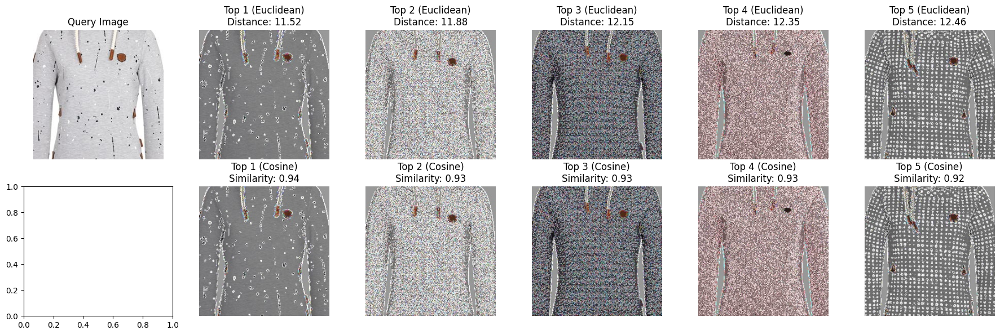

In [40]:
import sys
import csv
import ast
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import cosine, euclidean
from extractors.hog import hog_extractor

maxInt = sys.maxsize
csv.field_size_limit(maxInt)

features = []
image_names = []
with open("csvs/hog_features_preprocessed.csv", "r") as csvfile:
    reader = csv.reader(csvfile)
    next(reader)
    for row in reader:
        image_names.append(row[0])
        features.append([float(x) for x in ast.literal_eval(row[1])])


def get_all_image_paths(parent_dir):

    image_paths = []
    for dirpath, dirnames, filenames in os.walk(parent_dir):
        for filename in filenames:
            if filename.lower().endswith((".jpg", ".jpeg", ".png")):
                image_paths.append(os.path.join(dirpath, filename))
    return image_paths

def calculate_distances(query_image_path, parent_dir, top_n=5):
 

    
    query_image = cv2.imread(query_image_path)
    
    query_features = hog_extractor(query_image)

    query_features = np.array(query_features)  

    
    all_image_paths = get_all_image_paths(parent_dir)

    all_image_features = []
    for image_path in all_image_paths:
        image = cv2.imread(image_path)
        features = hog_extractor(image)
        all_image_features.append(features)

    cosine_similarities = []
    euclidean_distances = []
    for image_features in all_image_features:
        cosine_sim = 1 - cosine(query_features, image_features)
        cosine_similarities.append(cosine_sim)

        euclidean_dist = euclidean(query_features, image_features)
        euclidean_distances.append(euclidean_dist)

    sorted_data_cosine = sorted(zip(all_image_paths, cosine_similarities), key=lambda x: x[1], reverse=True)
    sorted_data_euclidean = sorted(zip(all_image_paths, euclidean_distances), key=lambda x: x[1])

    return sorted_data_cosine[:top_n], sorted_data_euclidean[:top_n]


parent_dir = "data/preprocessed"
query_image_path = "sample2.jpg"

top_distances_cosine, top_distances_euclidean = calculate_distances(query_image_path, parent_dir)

fig, axes = plt.subplots(2, 6, figsize=(18, 6)) 

axes[0, 0].imshow(cv2.cvtColor(cv2.imread(query_image_path), cv2.COLOR_BGR2RGB))
axes[0, 0].set_title("Query Image")
axes[0, 0].axis("off") 

for i, (image_path, similarity) in enumerate(top_distances_cosine, start=1):
    similar_image = cv2.imread(image_path)
    axes[1, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f"Top {i} (Cosine)\nSimilarity: {similarity:.2f}")
    axes[1, i].axis("off")

for i, (image_path, distance) in enumerate(top_distances_euclidean, start=1):
    similar_image = cv2.imread(image_path)
    axes[0, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"Top {i} (Euclidean)\nDistance: {distance:.2f}")
    axes[0, i].axis("off")

for i in range(1, 6):
    axes[0, i].axis("off")
    axes[1, i].axis("off")

plt.tight_layout()
plt.show()

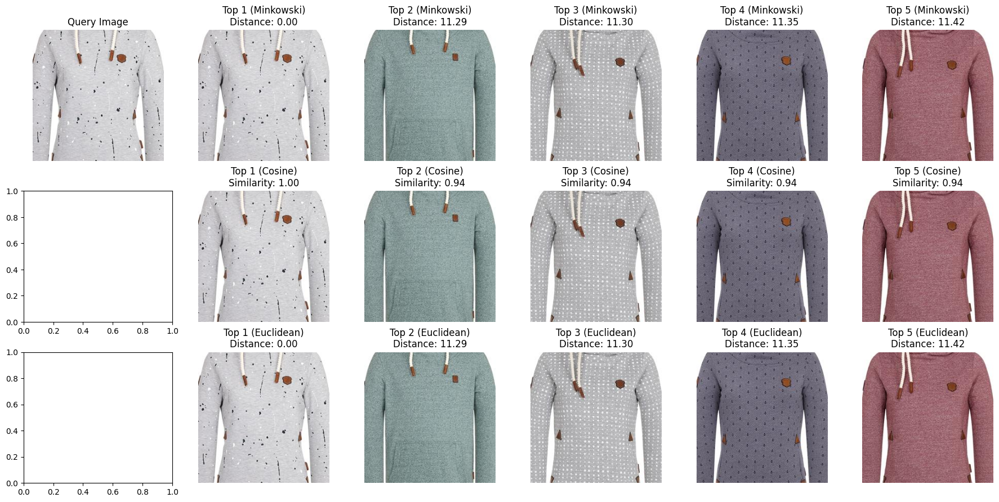

In [42]:
import sys
import csv
import ast
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import cosine, euclidean, minkowski
from extractors.hog import hog_extractor

maxInt = sys.maxsize
csv.field_size_limit(maxInt)

features = []
image_names = []
with open("csvs/hog_features_cropped.csv", "r") as csvfile:
    reader = csv.reader(csvfile)
    next(reader)  
    for row in reader:
        image_names.append(row[0])
        features.append([float(x) for x in ast.literal_eval(row[1])])


def get_all_image_paths(parent_dir):
    image_paths = []
    for dirpath, dirnames, filenames in os.walk(parent_dir):
        for filename in filenames:
            if filename.lower().endswith((".jpg", ".jpeg", ".png")):
                image_paths.append(os.path.join(dirpath, filename))
    return image_paths


def calculate_distances(query_image_path, parent_dir, top_n=5):
    query_image = cv2.imread(query_image_path)
    query_features = hog_extractor(query_image)

    query_features = np.array(query_features)

    all_image_paths = get_all_image_paths(parent_dir)

    all_image_features = []
    for image_path in all_image_paths:
        image = cv2.imread(image_path)
        features = hog_extractor(image)
        all_image_features.append(features)

    cosine_similarities = []
    euclidean_distances = []
    minkowski_distances = []
    for image_features in all_image_features:
        cosine_sim = 1 - cosine(query_features, image_features)
        cosine_similarities.append(cosine_sim)

        euclidean_dist = euclidean(query_features, image_features)
        euclidean_distances.append(euclidean_dist)

        minkowski_dist = minkowski(query_features, image_features, p=2)
        minkowski_distances.append(minkowski_dist)

    sorted_data_cosine = sorted(zip(all_image_paths, cosine_similarities), key=lambda x: x[1], reverse=True)
    sorted_data_euclidean = sorted(zip(all_image_paths, euclidean_distances), key=lambda x: x[1])
    sorted_data_minkowski = sorted(zip(all_image_paths, minkowski_distances), key=lambda x: x[1])

    return sorted_data_cosine[:top_n], sorted_data_euclidean[:top_n], sorted_data_minkowski[:top_n]


parent_dir = "data/cropped"
query_image_path = "sample2.jpg"

top_distances_cosine, top_distances_euclidean, top_distances_minkowski = calculate_distances(query_image_path, parent_dir)

fig, axes = plt.subplots(3, 6, figsize=(18, 9))

axes[0, 0].imshow(cv2.cvtColor(cv2.imread(query_image_path), cv2.COLOR_BGR2RGB))
axes[0, 0].set_title("Query Image")
axes[0, 0].axis("off")

for i, (image_path, similarity) in enumerate(top_distances_cosine, start=1):
    similar_image = cv2.imread(image_path)
    axes[1, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f"Top {i} (Cosine)\nSimilarity: {similarity:.2f}")
    axes[1, i].axis("off")

for i, (image_path, distance) in enumerate(top_distances_euclidean, start=1):
    similar_image = cv2.imread(image_path)
    axes[2, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[2, i].set_title(f"Top {i} (Euclidean)\nDistance: {distance:.2f}")
    axes[2, i].axis("off")

for i, (image_path, distance) in enumerate(top_distances_minkowski, start=1):
    similar_image = cv2.imread(image_path)
    axes[0, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"Top {i} (Minkowski)\nDistance: {distance:.2f}")
    axes[0, i].axis("off")

for i in range(1, 6):
    axes[0, i].axis("off")
    axes[1, i].axis("off")
    axes[2, i].axis("off")

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

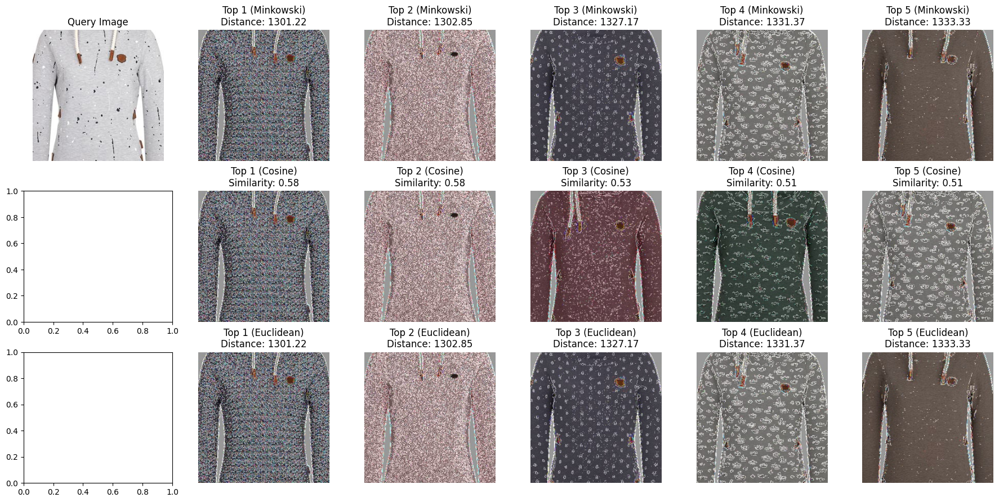

In [45]:
import sys
import csv
import ast
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import cosine, euclidean, minkowski
from extractors.vgg16 import vgg16_preprocess

maxInt = sys.maxsize
csv.field_size_limit(maxInt)

features = []
image_names = []
with open("csvs/vgg_features_preprocessed.csv", "r") as csvfile:
    reader = csv.reader(csvfile)
    next(reader)
    for row in reader:
        image_names.append(row[0])
        features.append([float(x) for x in ast.literal_eval(row[1])])


def get_all_image_paths(parent_dir):
    image_paths = []
    for dirpath, dirnames, filenames in os.walk(parent_dir):
        for filename in filenames:
            if filename.lower().endswith((".jpg", ".jpeg", ".png")):
                image_paths.append(os.path.join(dirpath, filename))
    return image_paths


def calculate_distances(query_image_path, parent_dir, top_n=5):
    query_image = cv2.imread(query_image_path)
    query_features = vgg16_preprocess(query_image)

    query_features = np.array(query_features)  

    all_image_paths = get_all_image_paths(parent_dir)

    all_image_features = []
    for image_path in all_image_paths:
        image = cv2.imread(image_path)
        features = vgg16_preprocess(image)
        all_image_features.append(features)

    cosine_similarities = []
    euclidean_distances = []
    minkowski_distances = []
    for image_features in all_image_features:
        cosine_sim = 1 - cosine(query_features, image_features)
        cosine_similarities.append(cosine_sim)

        euclidean_dist = euclidean(query_features, image_features)
        euclidean_distances.append(euclidean_dist)

        minkowski_dist = minkowski(query_features, image_features, p=2)
        minkowski_distances.append(minkowski_dist)

    sorted_data_cosine = sorted(zip(all_image_paths, cosine_similarities), key=lambda x: x[1], reverse=True)
    sorted_data_euclidean = sorted(zip(all_image_paths, euclidean_distances), key=lambda x: x[1])
    sorted_data_minkowski = sorted(zip(all_image_paths, minkowski_distances), key=lambda x: x[1])

    return sorted_data_cosine[:top_n], sorted_data_euclidean[:top_n], sorted_data_minkowski[:top_n]


parent_dir = "data/preprocessed"
query_image_path = "sample2.jpg"

top_distances_cosine, top_distances_euclidean, top_distances_minkowski = calculate_distances(query_image_path, parent_dir)

fig, axes = plt.subplots(3, 6, figsize=(18, 9))  

axes[0, 0].imshow(cv2.cvtColor(cv2.imread(query_image_path), cv2.COLOR_BGR2RGB))
axes[0, 0].set_title("Query Image")
axes[0, 0].axis("off")  

for i, (image_path, similarity) in enumerate(top_distances_cosine, start=1):
    similar_image = cv2.imread(image_path)
    axes[1, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f"Top {i} (Cosine)\nSimilarity: {similarity:.2f}")
    axes[1, i].axis("off")

for i, (image_path, distance) in enumerate(top_distances_euclidean, start=1):
    similar_image = cv2.imread(image_path)
    axes[2, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[2, i].set_title(f"Top {i} (Euclidean)\nDistance: {distance:.2f}")
    axes[2, i].axis("off")

for i, (image_path, distance) in enumerate(top_distances_minkowski, start=1):
    similar_image = cv2.imread(image_path)
    axes[0, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"Top {i} (Minkowski)\nDistance: {distance:.2f}")
    axes[0, i].axis("off")

for i in range(1, 6):
    axes[0, i].axis("off")
    axes[1, i].axis("off")
    axes[2, i].axis("off")

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

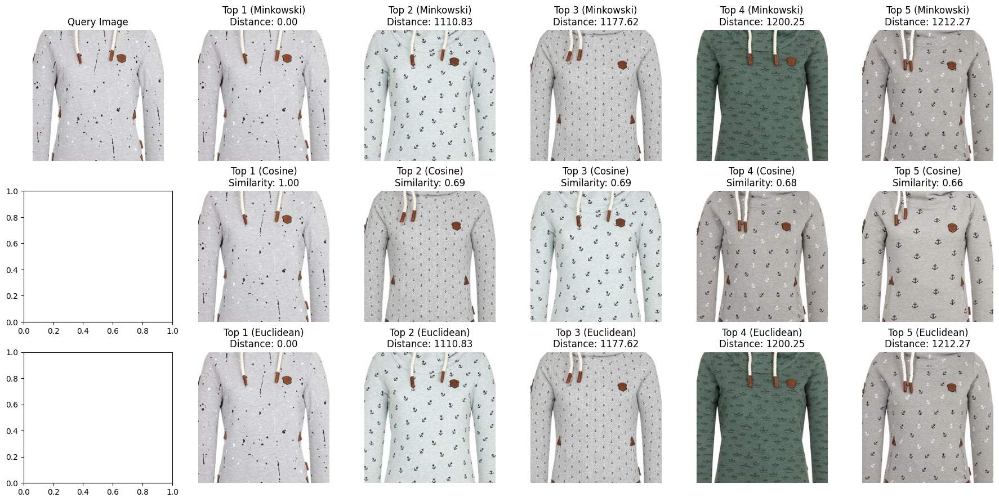

In [46]:
import sys
import csv
import ast
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import cosine, euclidean, minkowski
from extractors.vgg16 import vgg16_preprocess

maxInt = sys.maxsize
csv.field_size_limit(maxInt)

features = []
image_names = []
with open("csvs/vgg_features_cropped.csv", "r") as csvfile:
    reader = csv.reader(csvfile)
    next(reader)
    for row in reader:
        image_names.append(row[0])
        features.append([float(x) for x in ast.literal_eval(row[1])])


def get_all_image_paths(parent_dir):
    image_paths = []
    for dirpath, dirnames, filenames in os.walk(parent_dir):
        for filename in filenames:
            if filename.lower().endswith((".jpg", ".jpeg", ".png")):
                image_paths.append(os.path.join(dirpath, filename))
    return image_paths


def calculate_distances(query_image_path, parent_dir, top_n=5):
    query_image = cv2.imread(query_image_path)
    query_features = vgg16_preprocess(query_image)

    query_features = np.array(query_features)

    all_image_paths = get_all_image_paths(parent_dir)

    all_image_features = []
    for image_path in all_image_paths:
        image = cv2.imread(image_path)
        features = vgg16_preprocess(image)
        all_image_features.append(features)

    cosine_similarities = []
    euclidean_distances = []
    minkowski_distances = []
    for image_features in all_image_features:
        cosine_sim = 1 - cosine(query_features, image_features)
        cosine_similarities.append(cosine_sim)

        euclidean_dist = euclidean(query_features, image_features)
        euclidean_distances.append(euclidean_dist)

        minkowski_dist = minkowski(query_features, image_features, p=2)
        minkowski_distances.append(minkowski_dist)

    sorted_data_cosine = sorted(zip(all_image_paths, cosine_similarities), key=lambda x: x[1], reverse=True)
    sorted_data_euclidean = sorted(zip(all_image_paths, euclidean_distances), key=lambda x: x[1])
    sorted_data_minkowski = sorted(zip(all_image_paths, minkowski_distances), key=lambda x: x[1])

    return sorted_data_cosine[:top_n], sorted_data_euclidean[:top_n], sorted_data_minkowski[:top_n]


parent_dir = "data/cropped"
query_image_path = "sample2.jpg"

top_distances_cosine, top_distances_euclidean, top_distances_minkowski = calculate_distances(query_image_path, parent_dir)

fig, axes = plt.subplots(3, 6, figsize=(18, 9))

axes[0, 0].imshow(cv2.cvtColor(cv2.imread(query_image_path), cv2.COLOR_BGR2RGB))
axes[0, 0].set_title("Query Image")
axes[0, 0].axis("off")

for i, (image_path, similarity) in enumerate(top_distances_cosine, start=1):
    similar_image = cv2.imread(image_path)
    axes[1, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f"Top {i} (Cosine)\nSimilarity: {similarity:.2f}")
    axes[1, i].axis("off")

for i, (image_path, distance) in enumerate(top_distances_euclidean, start=1):
    similar_image = cv2.imread(image_path)
    axes[2, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[2, i].set_title(f"Top {i} (Euclidean)\nDistance: {distance:.2f}")
    axes[2, i].axis("off")

for i, (image_path, distance) in enumerate(top_distances_minkowski, start=1):
    similar_image = cv2.imread(image_path)
    axes[0, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"Top {i} (Minkowski)\nDistance: {distance:.2f}")
    axes[0, i].axis("off")

for i in range(1, 6):
    axes[0, i].axis("off")
    axes[1, i].axis("off")
    axes[2, i].axis("off")

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

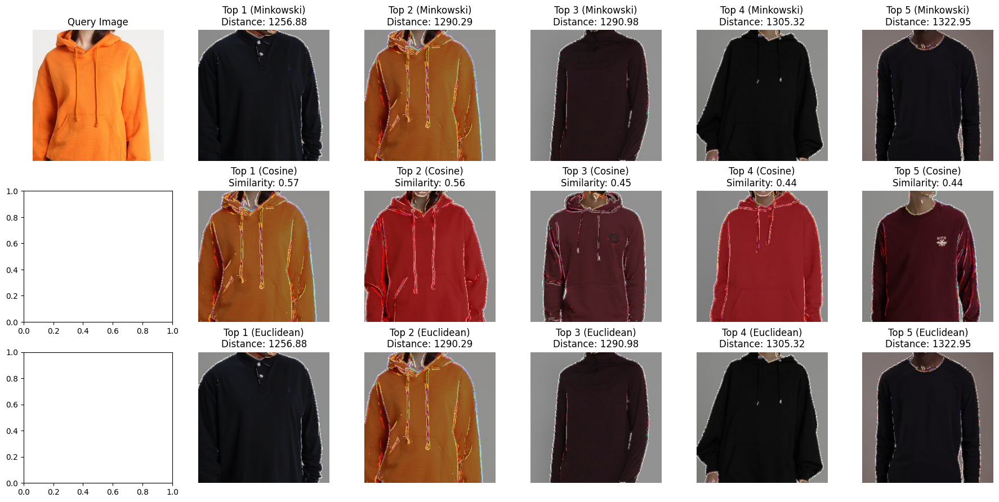

In [48]:
import sys
import csv
import ast
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import cosine, euclidean, minkowski
from extractors.vgg16 import vgg16_preprocess

maxInt = sys.maxsize
csv.field_size_limit(maxInt)

features = []
image_names = []
with open("csvs/vgg_features_preprocessed.csv", "r") as csvfile:
    reader = csv.reader(csvfile)
    next(reader)
    for row in reader:
        image_names.append(row[0])
        features.append([float(x) for x in ast.literal_eval(row[1])])


def get_all_image_paths(parent_dir):
    image_paths = []
    for dirpath, dirnames, filenames in os.walk(parent_dir):
        for filename in filenames:
            if filename.lower().endswith((".jpg", ".jpeg", ".png")):
                image_paths.append(os.path.join(dirpath, filename))
    return image_paths


def calculate_distances(query_image_path, parent_dir, top_n=5):
    query_image = cv2.imread(query_image_path)
    query_features = vgg16_preprocess(query_image)

    query_features = np.array(query_features)

    all_image_paths = get_all_image_paths(parent_dir)

    all_image_features = []
    for image_path in all_image_paths:
        image = cv2.imread(image_path)
        features = vgg16_preprocess(image)
        all_image_features.append(features)

    cosine_similarities = []
    euclidean_distances = []
    minkowski_distances = []
    for image_features in all_image_features:
        cosine_sim = 1 - cosine(query_features, image_features)
        cosine_similarities.append(cosine_sim)

        euclidean_dist = euclidean(query_features, image_features)
        euclidean_distances.append(euclidean_dist)

        minkowski_dist = minkowski(query_features, image_features, p=2)
        minkowski_distances.append(minkowski_dist)

    sorted_data_cosine = sorted(zip(all_image_paths, cosine_similarities), key=lambda x: x[1], reverse=True)
    sorted_data_euclidean = sorted(zip(all_image_paths, euclidean_distances), key=lambda x: x[1])
    sorted_data_minkowski = sorted(zip(all_image_paths, minkowski_distances), key=lambda x: x[1])

    return sorted_data_cosine[:top_n], sorted_data_euclidean[:top_n], sorted_data_minkowski[:top_n]


parent_dir = "data/preprocessed"
query_image_path = "sample3.jpg"

top_distances_cosine, top_distances_euclidean, top_distances_minkowski = calculate_distances(query_image_path, parent_dir)

fig, axes = plt.subplots(3, 6, figsize=(18, 9))

axes[0, 0].imshow(cv2.cvtColor(cv2.imread(query_image_path), cv2.COLOR_BGR2RGB))
axes[0, 0].set_title("Query Image")
axes[0, 0].axis("off") 

for i, (image_path, similarity) in enumerate(top_distances_cosine, start=1):
    similar_image = cv2.imread(image_path)
    axes[1, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f"Top {i} (Cosine)\nSimilarity: {similarity:.2f}")
    axes[1, i].axis("off")

for i, (image_path, distance) in enumerate(top_distances_euclidean, start=1):
    similar_image = cv2.imread(image_path)
    axes[2, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[2, i].set_title(f"Top {i} (Euclidean)\nDistance: {distance:.2f}")
    axes[2, i].axis("off")

for i, (image_path, distance) in enumerate(top_distances_minkowski, start=1):
    similar_image = cv2.imread(image_path)
    axes[0, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"Top {i} (Minkowski)\nDistance: {distance:.2f}")
    axes[0, i].axis("off")

for i in range(1, 6):
    axes[0, i].axis("off")
    axes[1, i].axis("off")
    axes[2, i].axis("off")


plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

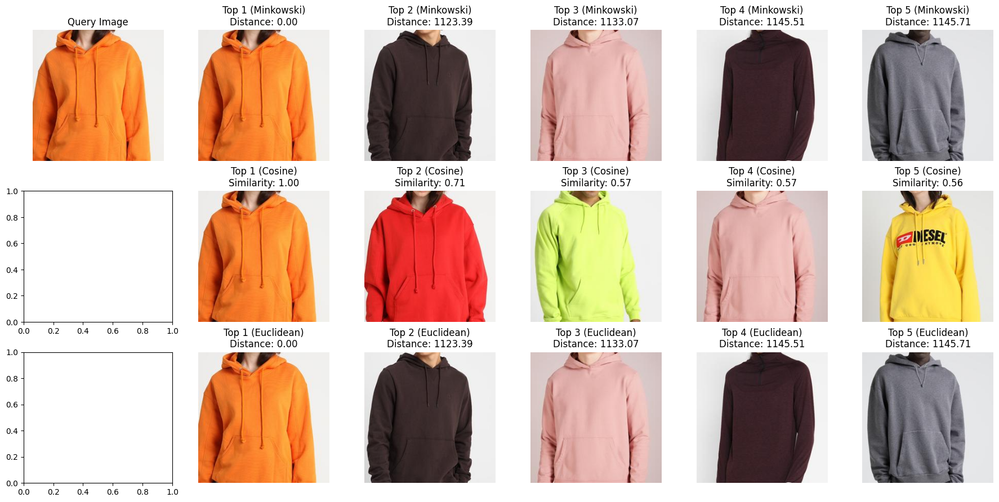

In [49]:
import sys
import csv
import ast
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import cosine, euclidean, minkowski
from extractors.vgg16 import vgg16_preprocess

maxInt = sys.maxsize
csv.field_size_limit(maxInt)


features = []
image_names = []
with open("csvs/vgg_features_cropped.csv", "r") as csvfile:
    reader = csv.reader(csvfile)
    next(reader)  
    for row in reader:
        image_names.append(row[0])
        features.append([float(x) for x in ast.literal_eval(row[1])])


def get_all_image_paths(parent_dir):
    image_paths = []
    for dirpath, dirnames, filenames in os.walk(parent_dir):
        for filename in filenames:
            if filename.lower().endswith((".jpg", ".jpeg", ".png")):
                image_paths.append(os.path.join(dirpath, filename))
    return image_paths


def calculate_distances(query_image_path, parent_dir, top_n=5):
    query_image = cv2.imread(query_image_path)
    query_features = vgg16_preprocess(query_image)

    query_features = np.array(query_features)

    all_image_paths = get_all_image_paths(parent_dir)

    all_image_features = []
    for image_path in all_image_paths:
        image = cv2.imread(image_path)
        features = vgg16_preprocess(image)
        all_image_features.append(features)

    cosine_similarities = []
    euclidean_distances = []
    minkowski_distances = []
    for image_features in all_image_features:
        cosine_sim = 1 - cosine(query_features, image_features)
        cosine_similarities.append(cosine_sim)

        euclidean_dist = euclidean(query_features, image_features)
        euclidean_distances.append(euclidean_dist)

        minkowski_dist = minkowski(query_features, image_features, p=2)
        minkowski_distances.append(minkowski_dist)

    sorted_data_cosine = sorted(zip(all_image_paths, cosine_similarities), key=lambda x: x[1], reverse=True)
    sorted_data_euclidean = sorted(zip(all_image_paths, euclidean_distances), key=lambda x: x[1])
    sorted_data_minkowski = sorted(zip(all_image_paths, minkowski_distances), key=lambda x: x[1])

    return sorted_data_cosine[:top_n], sorted_data_euclidean[:top_n], sorted_data_minkowski[:top_n]


parent_dir = "data/cropped"
query_image_path = "sample3.jpg"

top_distances_cosine, top_distances_euclidean, top_distances_minkowski = calculate_distances(query_image_path, parent_dir)

fig, axes = plt.subplots(3, 6, figsize=(18, 9))

axes[0, 0].imshow(cv2.cvtColor(cv2.imread(query_image_path), cv2.COLOR_BGR2RGB))
axes[0, 0].set_title("Query Image")
axes[0, 0].axis("off")  

for i, (image_path, similarity) in enumerate(top_distances_cosine, start=1):
    similar_image = cv2.imread(image_path)
    axes[1, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f"Top {i} (Cosine)\nSimilarity: {similarity:.2f}")
    axes[1, i].axis("off")

for i, (image_path, distance) in enumerate(top_distances_euclidean, start=1):
    similar_image = cv2.imread(image_path)
    axes[2, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[2, i].set_title(f"Top {i} (Euclidean)\nDistance: {distance:.2f}")
    axes[2, i].axis("off")

for i, (image_path, distance) in enumerate(top_distances_minkowski, start=1):
    similar_image = cv2.imread(image_path)
    axes[0, i].imshow(cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"Top {i} (Minkowski)\nDistance: {distance:.2f}")
    axes[0, i].axis("off")

for i in range(1, 6):
    axes[0, i].axis("off")
    axes[1, i].axis("off")
    axes[2, i].axis("off")

plt.tight_layout()
plt.show()